<a href="https://colab.research.google.com/github/grantgasser/moonhub/blob/master/Moonhub_Diversity_Search.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Moonhub Diversity Search Task

## Summary
Words here

### Goal
Predict Woman / Not Woman using LinkedIn profile data.

### Approach


### Results


### Assumptions
- I have correctly labelled Woman/Not Woman by viewing pictures and first names (est. 2-3% error rate) 

### Improvements
- Label more records (Scale AI, Mechanical Turk, manually, etc.)
- Add new natural language features: `volunteering`, `organizations`, etc.
- Given enough examples, train a Transformer
- Ideal but unlikely: get ground truth labels, possibly by self-identification

In [1]:
import json
import os
import requests
import io
import time

import warnings
warnings.filterwarnings("ignore")

#from IPython.display import Image, clear_output
from PIL import Image
import urllib.request
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, average_precision_score

In [21]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [4]:
%%time

candidates = []
load_errors = 0
with open('/content/drive/MyDrive/people_sample.jsonl', 'r') as f:
    for line in f:
        try:
            candidates.append(json.loads(line))
        except ValueError as e:
            load_errors += 1

print(f'Read {len(candidates)} lines, could not read {load_errors} lines.')

Read 200000 lines, could not read 0 lines.
CPU times: user 31.6 s, sys: 5.74 s, total: 37.4 s
Wall time: 44.5 s


In [ ]:
df = pd.DataFrame(candidates)

df.head(2)

,profile_pic,last_name,profile_id,updated_at,education,connection_count,first_name,user_id,title,headline,...,created_at,locality,experience,summary,skills,specialties,publications,position,follower_count,patents
0,https://s3.amazonaws.com/media.mixrank.com/pro...,Ran,-2147480832,2022-02-24T07:35:42.327624,"[{'activities': None, 'school': {'id': None, '...",43.0,Yu,NaN,Executive Assistant,百岳特生物科技（上海） - Executive Assistant,...,2021-05-27T07:33:06.478974,"The Hague, South Holland, Netherlands","[{'end_date': '2019-07-01', 'locality': 'Nethe...",Enthusiastic individual with strong communicat...,None,None,None,"{'title': 'Executive Assistant', 'linkedin_com...",NaN,None
1,None,Duel,-2147477352,2021-04-18T02:18:24.714766,None,NaN,David,NaN,Senior Affiliate Manager at AFFBROS,Senior Affiliate Manager at AFFBROS,...,2019-04-24T19:07:29.90645,None,"[{'end_date': None, 'locality': None, 'linkedi...",None,None,None,None,{'title': 'Senior Affiliate Manager at AFFBROS...,NaN,None


In [ ]:
# Get an idea of % of not null per column
df.isnull().sum() / df.shape[0]

profile_pic           0.392285
last_name             0.089845
profile_id            0.000000
updated_at            0.000000
education             0.283215
connection_count      0.123465
first_name            0.089840
user_id               0.995430
title                 0.211280
headline              0.105350
industry_id           0.868580
jobs_count            0.109075
slug                  0.000000
languages             0.658925
company_name          0.185460
country_iso           0.060905
country_name          0.060905
slugs                 0.000000
people_also_viewed    0.288235
interests             0.978055
recommender_count     0.778510
others_named          0.474095
person_id             0.000115
awards                0.886000
courses               0.884595
job_posts             0.968590
snap_id               0.043820
industry_name         0.868580
projects              0.877605
articles              1.000000
certifications        0.724765
name                  0.047285
voluntee

In [ ]:
# Too many records for us to label, so let's cut it down for now
# df_sample = df.sample(n=1000)

# df_sample.shape

(1000, 44)

In [ ]:
# Add label column (1: Woman, 0: Not Woman)
#df_sample["label"] = None

In [5]:
DF_LABELLED_FILE_PATH = '/content/drive/MyDrive/df_labelled.csv'
df_sample = pd.read_csv(DF_LABELLED_FILE_PATH, index_col=0)
df_sample.head(2)

,profile_pic,last_name,profile_id,updated_at,education,connection_count,first_name,user_id,title,headline,...,locality,experience,summary,skills,specialties,publications,position,follower_count,patents,label
148034,NaN,NaN,-1961498432,2018-05-04T07:29:09.576976,NaN,NaN,NaN,NaN,NaN,Construction Management,...,NaN,NaN,NaN,NaN,NaN,NaN,"{'title': None, 'linkedin_company_id': None, '...",NaN,NaN,NaN
111761,NaN,L.,-2007015192,2021-01-11T15:59:14.969342,NaN,NaN,Lisa,NaN,Naturopathe - Reflexologue Marseille,Naturopathe - Réflexologue chez Naturoliz,...,NaN,"[{'end_date': None, 'locality': None, 'linkedi...",NaN,NaN,NaN,NaN,{'title': 'Naturopathe - Reflexologue Marseill...,NaN,NaN,NaN


First, we need labels

- Manually label where we have `profile_pic`.
- We could also use the LinkedIn API to grab other profile pics using `url` if we need more labels
- Alternatively could use Scale AI API to label records

In [37]:
"""Allows us to manually label records from the notebook"""
def label_api(df_sample, num_to_label=10):
  # Grab unlabelled samples with profile pics
  df_label_sample = df_sample[df_sample["profile_pic"].notnull() & df_sample["label"].isnull()]
  print(df_label_sample.shape[0], ' remaining to label.')

  for i in range(num_to_label):
    url = df_label_sample['profile_pic'].iloc[i]
    first_name = df_label_sample['first_name'].iloc[i]
    idx = df_label_sample.iloc[i].name

    try:
      response = requests.get(url)
      img = Image.open(io.BytesIO(response.content))

      # Display the image
      plt.title(f'Name: {first_name}')
      plt.imshow(img)
      plt.show()
      plt.close()

      # To ensure input() prompt occurs after image display
      time.sleep(1)

      manual_label = input("Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: ")
      if manual_label == '1':
        # add positive label
        df_sample['label'].loc[idx] = 1
        print(f'Candidate labelled as Woman (1) at index: {idx}\n')
      elif manual_label == '0':
        # add negative label
        df_sample['label'].loc[idx] = 0
        print(f'Candidate labelled as Not Woman (0) at index: {idx}\n')
      elif manual_label == '-1':
        print(f'Candidate labelled as Unsure (-1) at index: {idx}\n. These will be removed.')
        df_sample['label'].loc[idx] = -1
      else:
        print("\nEntered character other than 0/1/u. Record not labelled.\n")

    except:
      print('\nCould not request and open image. Moving on.\n')

  # Update the file to save progress
  print(f'Writing to {DF_LABELLED_FILE_PATH}')
  df_sample.to_csv(DF_LABELLED_FILE_PATH, index=True)

195  remaining to label.


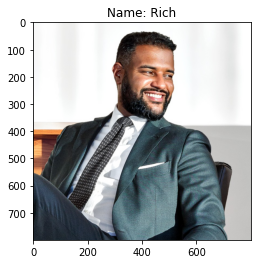

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 142760



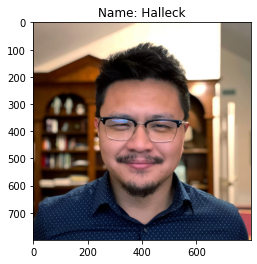

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 157701



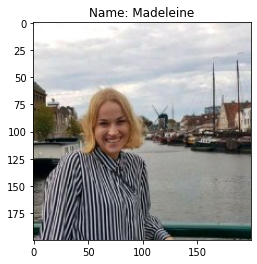

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 38903



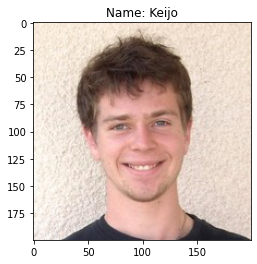

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 142514



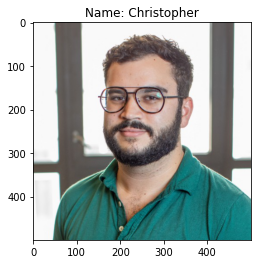

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 174073



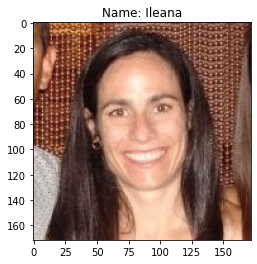

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 138488



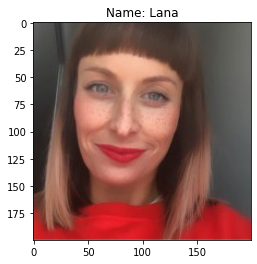

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 83050



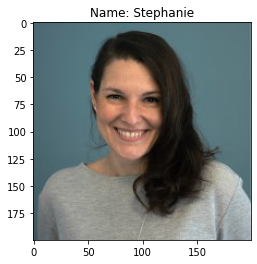

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 189063



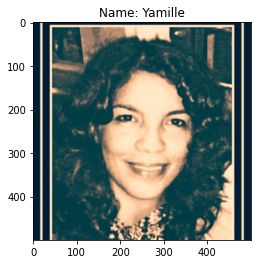

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 60501



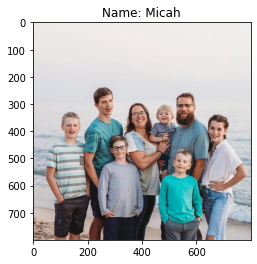

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: -1
Candidate labelled as Unsure (-1) at index: 174739
. These will be removed.


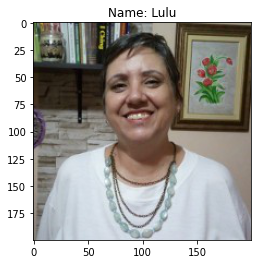

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 124014



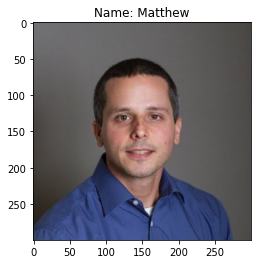

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 18373



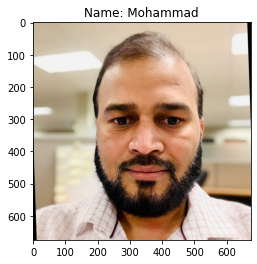

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 134362



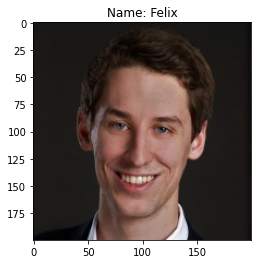

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 17236



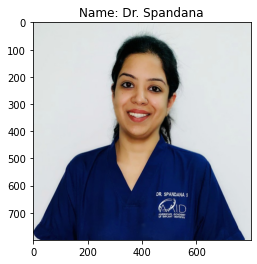

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 184018



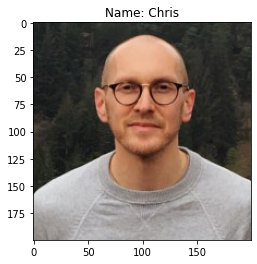

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 188983



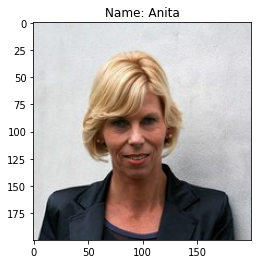

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 193039



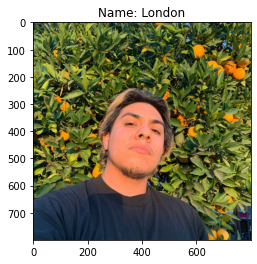

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: -1
Candidate labelled as Unsure (-1) at index: 125225
. These will be removed.


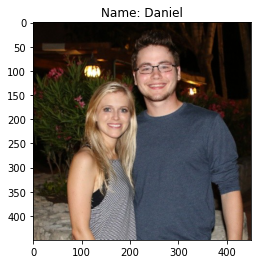

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 172802



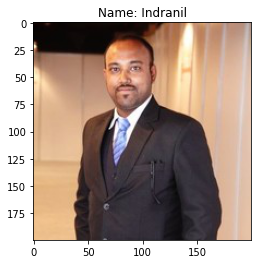

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 113151



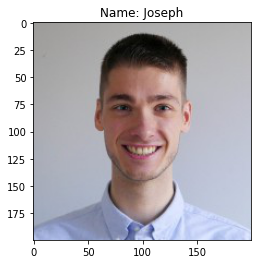

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 43195



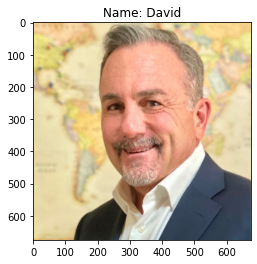

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 147031



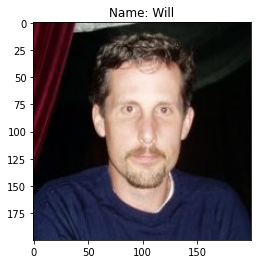

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 55755



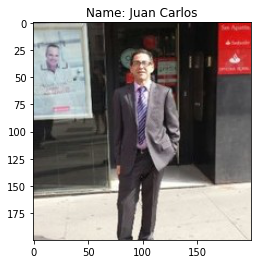

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 17145



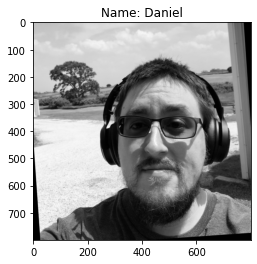

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 174961



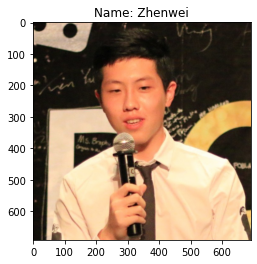

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 87245



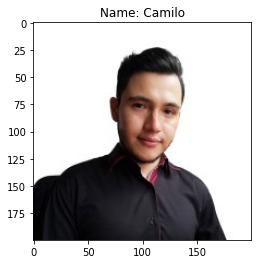

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 106220



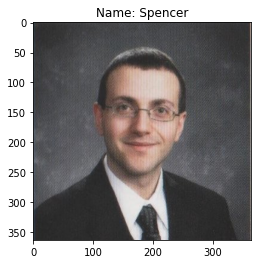

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 111494



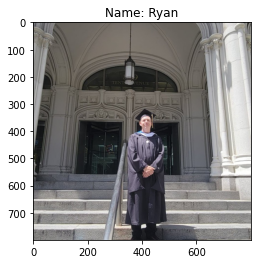

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 156229



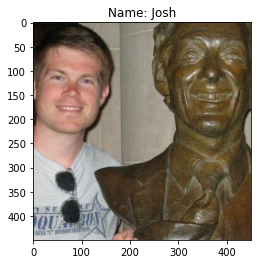

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 65861



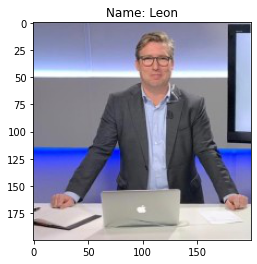

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 29429



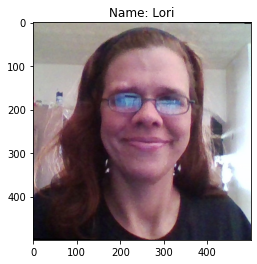

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 199704



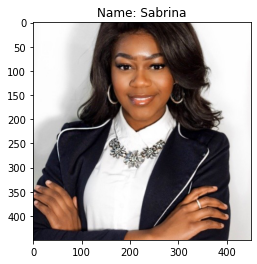

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 26434



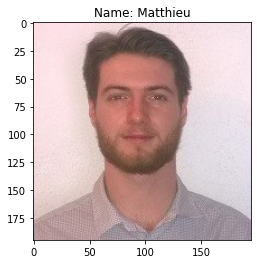

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 118422



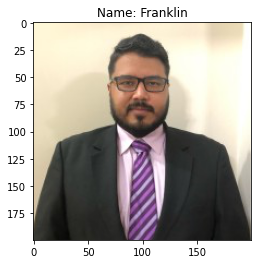

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 164073



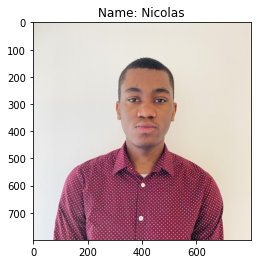

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 195450



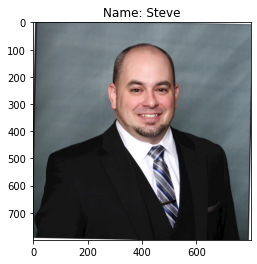

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 176660



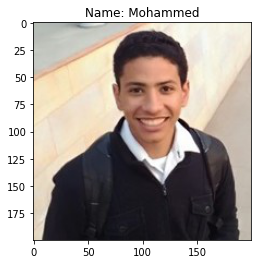

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 62799



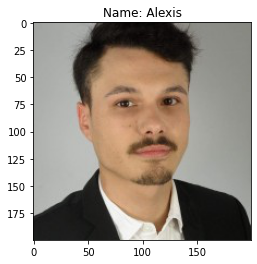

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 105316



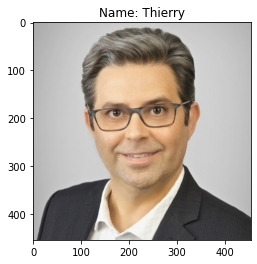

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 21947



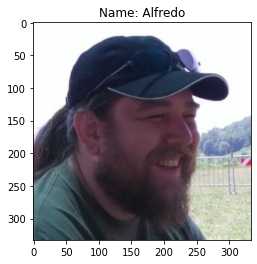

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 8248



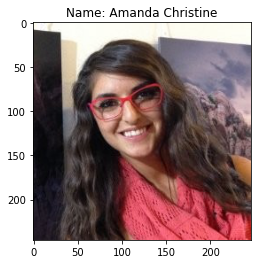

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 197966



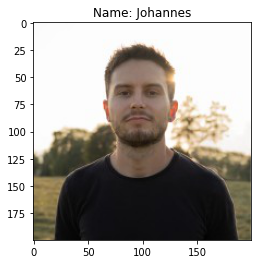

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 63669



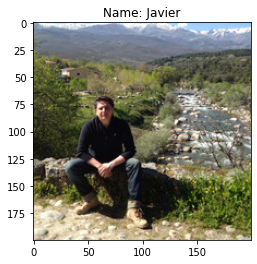

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 188697



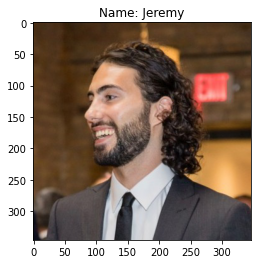

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 116470



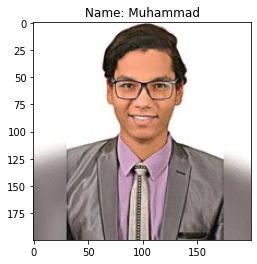

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 125065



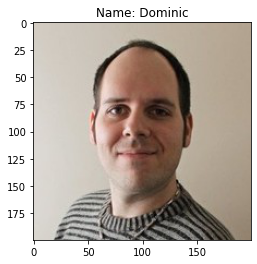

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 59743



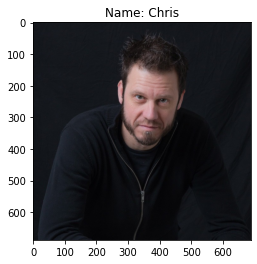

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 71704



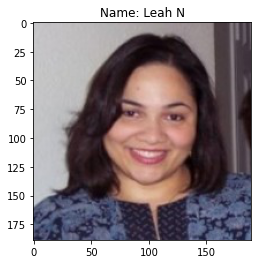

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 70682



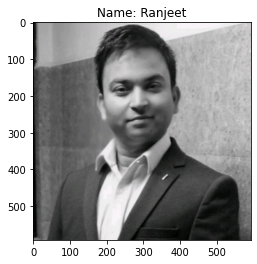

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 65011



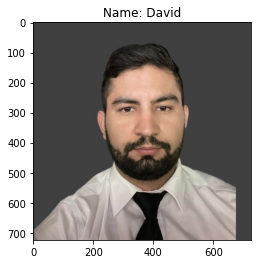

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 177663



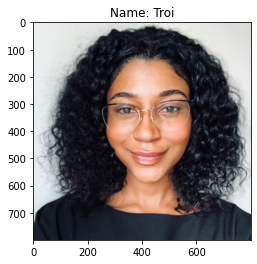

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 138143



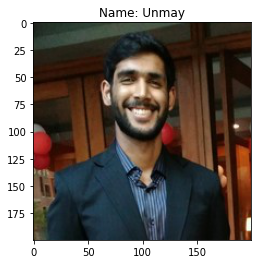

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 37002



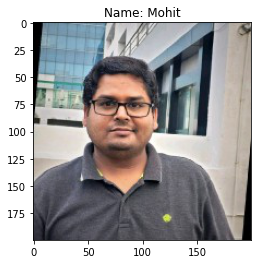

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 51031



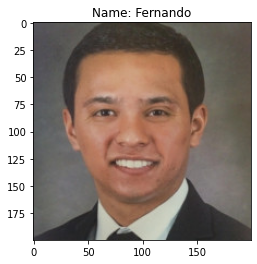

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 63209



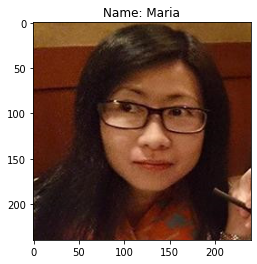

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 92503



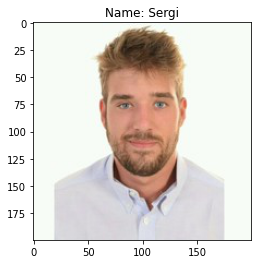

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 113184



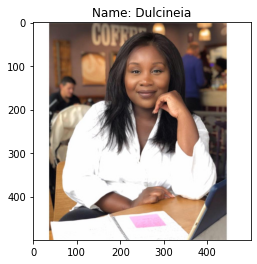

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 191777



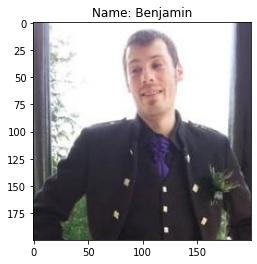

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 127329



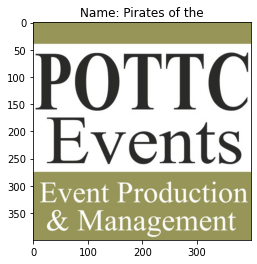

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 180412



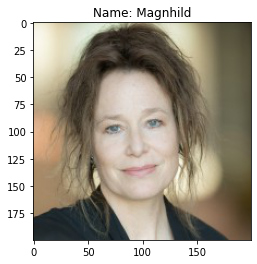

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 16187



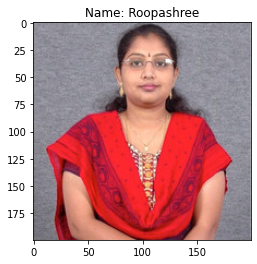

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 29044



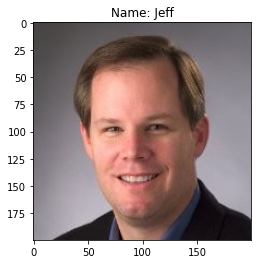

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 60451



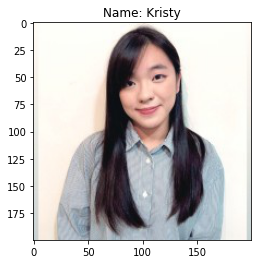

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 171479



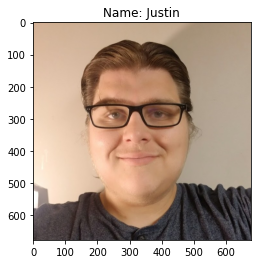

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 25612


Could not request and open image. Moving on.



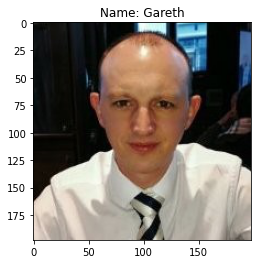

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 166854



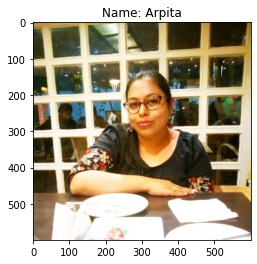

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 142061



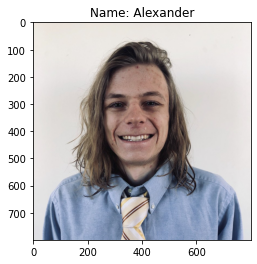

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 97294



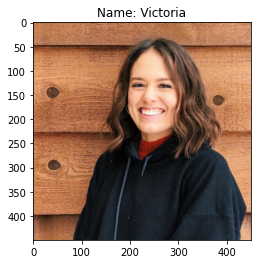

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 192170



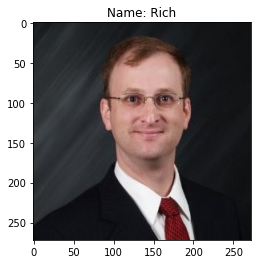

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 122761



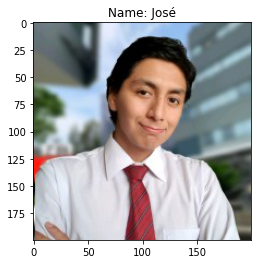

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 145880



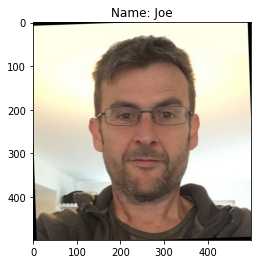

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 103964



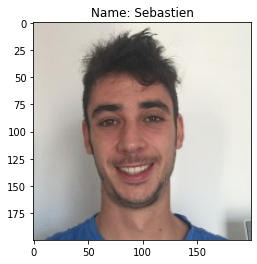

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 147658



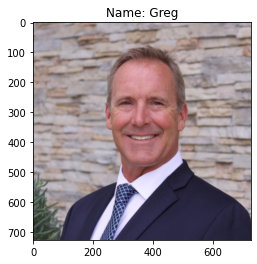

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 176232



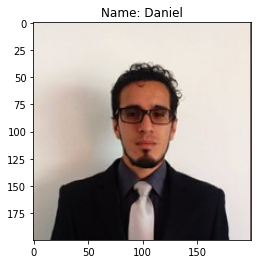

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 94577



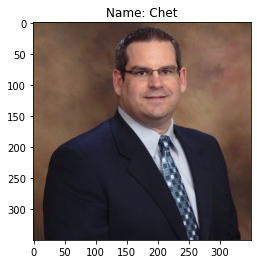

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 27864



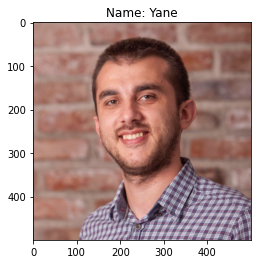

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 30018



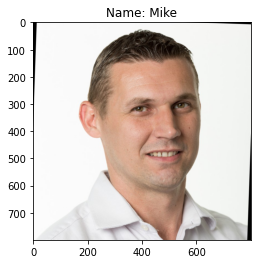

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 37640



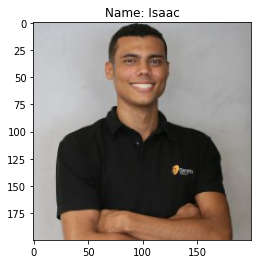

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 61673



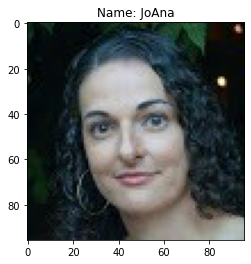

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 77739



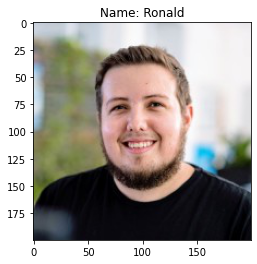

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 61129



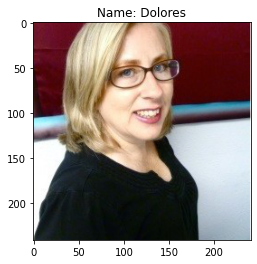

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 12611



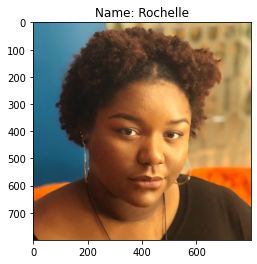

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 81087



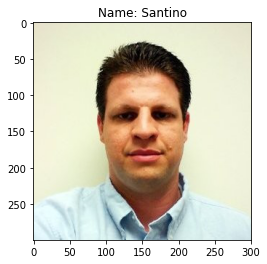

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 167722



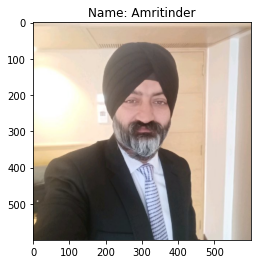

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 154605



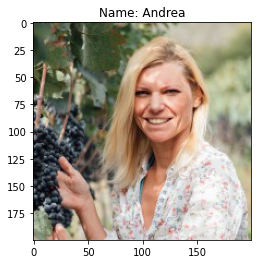

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 172670



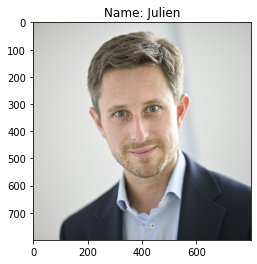

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 4100



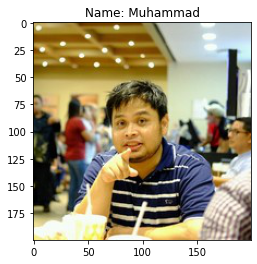

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 182814



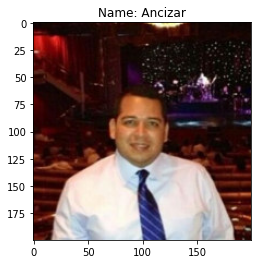

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 123733



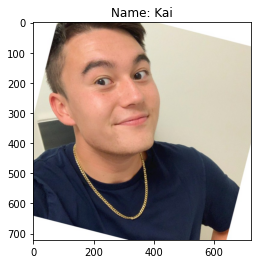

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 161151



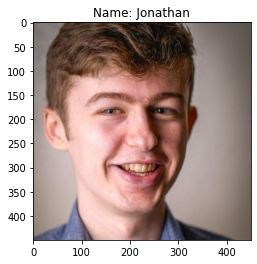

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 189708



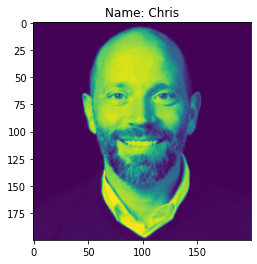

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 119968



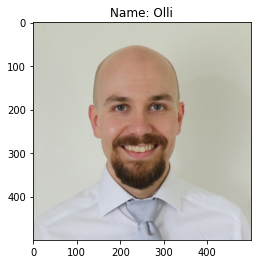

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 125384



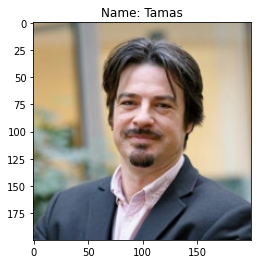

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 82947



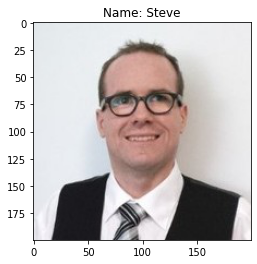

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 146203



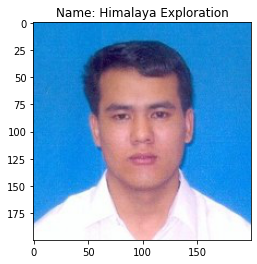

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 0
Candidate labelled as Not Woman (0) at index: 177818



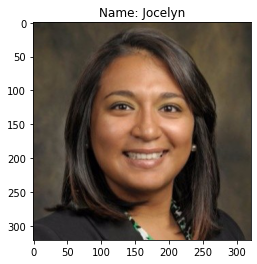

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 28558



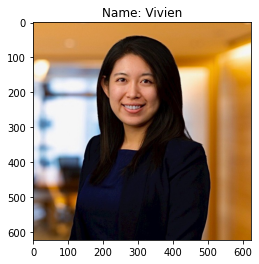

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 182195



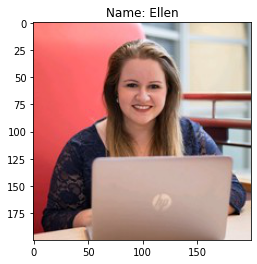

Enter '1' for Woman, '0' for Not Woman, or '-1' for unsure: 1
Candidate labelled as Woman (1) at index: 457

Writing to /content/drive/MyDrive/df_labelled.csv


In [136]:
label_api(df_sample, 100)

In [6]:
print('We now have about', df_sample[df_sample["label"].notnull()].shape[0], 'labelled samples.')

We now have about 501 labelled samples.


In [ ]:
# Write to csv for Scale AI upload/labelling
# df_for_csv = df.sample(5000)
# df_for_csv.rename(columns={'url': 'attachment_url'}, inplace=True)
# df_for_csv.to_csv('candidates_5000.csv', index=False)

In [7]:
# REMEMBER: remove records we're unsure about
main_df = df_sample[df_sample["label"].notnull()]
main_df = main_df[main_df["label"] != -1]
main_df.shape

(485, 45)

## Traditional Model w/ Structured Data (Model 1)

Start with a few simple features:
- `connection_count`
- `jobs_count`
- `len_skills` 

In [8]:
features_label = ["connection_count", "jobs_count", "skills", "label"]
feature_df = main_df[features_label]

feature_df.head()

,connection_count,jobs_count,skills,label
20355,500.0,8.0,NaN,0.0
185171,500.0,3.0,NaN,0.0
79672,116.0,10.0,"['Editing', 'Blogging', 'Team Leadership', 'St...",1.0
115788,500.0,0.0,NaN,1.0
192483,500.0,0.0,NaN,0.0


In [9]:
#Replace missing
feature_df.isnull().sum()

connection_count      4
jobs_count            0
skills              413
label                 0
dtype: int64

In [10]:
# Replace missing connection_count with mean
feature_df["connection_count"].fillna(feature_df["connection_count"].mean(), inplace=True)

In [11]:
# Create len_skills column
feature_df["skills"] = feature_df["skills"].apply(lambda x: [] if pd.isna(x) else x)
feature_df["len_skills"] = feature_df["skills"].apply(lambda x: len(x))
feature_df.drop("skills", axis=1, inplace=True)

feature_df.head()

,connection_count,jobs_count,label,len_skills
20355,500.0,8.0,0.0,0
185171,500.0,3.0,0.0,0
79672,116.0,10.0,1.0,600
115788,500.0,0.0,1.0,0
192483,500.0,0.0,0.0,0


In [12]:
X, y = feature_df.drop("label", axis=1), feature_df["label"]

Class Balance: ~65/35

In [13]:
y.value_counts()

0.0    313
1.0    172
Name: label, dtype: int64

Train / Test Split
- 1st run with 290 samples: 53%
- 2nd run with 388 samples: 60%
- 3rd run with 485 samples: 65%, but precision/recall are bad (class imbalance artificially boosting accuracy

In [14]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42)

In [15]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier()
rf_clf.fit(X_train, y_train)

RandomForestClassifier()

In [16]:
# Accuracy
rf_accuracy = rf_clf.score(X_valid, y_valid)
print('Accuracy: {:.2%}'.format(round(rf_accuracy, 4)))

y_pred = rf_clf.predict(X_valid)

# Precision
prec = precision_score(y_valid, y_pred)
print("Precision:", prec)

# Recall
rec = recall_score(y_valid, y_pred)
print("Recall:", rec)

# F1 Score
f1 = f1_score(y_valid, y_pred)
print("F1 Score:", f1)

# ROC AUC
roc_auc = roc_auc_score(y_valid, y_pred)
print("ROC AUC:", roc_auc)

Accuracy: 63.92%
Precision: 0.3793103448275862
Recall: 0.39285714285714285
F1 Score: 0.3859649122807017
ROC AUC: 0.5659937888198757


ROC=.57 suggests a slightly better than random classifier. Maybe training a classifier just based on the numerical features is insufficient and we need
natural language features.

----------------------------------------------

## NLP Model (Model 2)

Current Features
- `first_name`

To add:
- `slug`
- `volunteering.role`, `volunteering.cause`
- `interests`

Want to be careful of reinforcing biases by using features such as `title`, 
`skills`, etc

In [17]:
!pip install openai

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 KB 2.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for openai: filename=openai-0.26.5-py3-none-any.whl size=67620 sha256=f4847965f574529fa910fc1105f6867a8a7b6c4a064867a1a9cc184f3431fcba
  Stored in directory: /root/.cache/pip/wheels/a7/47/99/8273a59fbd59c303e8ff175416d5c1c9c03a2e83ebf7525a99
Successfully built openai


In [23]:
import openai

API_KEY_PATH = '/content/drive/MyDrive/openai_api_key.txt'

with open(API_KEY_PATH, 'r') as f:
  openai.api_key  = f.read().strip()

woman_name1 = openai.Embedding.create(input = ["Diana"], model="text-embedding-ada-002")['data'][0]['embedding']
woman_name2 = openai.Embedding.create(input = ["Maria Salazar"], model="text-embedding-ada-002")['data'][0]['embedding']
print(woman_name1)

[-0.025324754416942596, -0.0049302163533866405, -0.023890266194939613, -0.02860933169722557, -0.015752561390399933, 0.04048743098974228, -0.015176083892583847, -0.00896220188587904, -0.003482321510091424, -0.027644068002700806, 0.0016330713406205177, 0.011449094861745834, 0.009082859382033348, -0.0018266267143189907, -0.0019506362732499838, 0.013419841416180134, 0.02461421489715576, -0.009364394471049309, 0.0312638059258461, -0.01890307292342186, -0.015873217955231667, 0.017146829515695572, 0.022361932322382927, 0.020297342911362648, -0.01220655906945467, -0.0022925003431737423, 0.014720265753567219, -0.02793901041150093, 0.015162677504122257, -0.026638586074113846, 0.015095645561814308, -0.019412517547607422, -0.004534726496785879, -0.02511025220155716, -0.023193132132291794, -0.02019008994102478, 0.0030700734350830317, -0.004618516657501459, 0.004605110269039869, 0.0018115445272997022, 0.008573414757847786, 0.029091963544487953, -0.016744637861847878, 0.00470565864816308, -0.03292620

In [24]:
not_woman_name1 = openai.Embedding.create(input = ["Ramit"], model="text-embedding-ada-002")['data'][0]['embedding']
print(not_woman_name1)

[-0.009782617911696434, -0.012580526992678642, -0.01680087484419346, 0.0009829584741964936, -0.004794019740074873, 0.028931858018040657, -0.02418144978582859, -0.020491162315011024, -0.021846504881978035, -0.018518535420298576, 0.01763286627829075, 0.008829852566123009, 0.010024163872003555, -0.003837899537757039, 0.002348365029320121, -0.007863667793571949, 0.030407972633838654, -0.008843271993100643, 0.024074096232652664, 0.011084282770752907, -0.008836562745273113, -0.0041096387431025505, 0.014881924726068974, -0.011701568029820919, 0.0011347635881975293, -0.014291479252278805, 0.016894809901714325, -0.01755235157907009, 0.019135819748044014, -0.047906648367643356, 0.028770826756954193, -0.016961906105279922, -0.03220614790916443, -0.02223566174507141, -0.0219404399394989, 0.008601726032793522, 0.000497350178193301, 0.0010676673846319318, 0.01918949745595455, -0.007414123974740505, 0.03566830977797508, 0.01069512590765953, -0.002601653104647994, 0.008762756362557411, -0.009527652524

After trying a few examples, it appears these embeddings separate common female names from common male names.

Unlike using most common names datasets, OpenAI embeddings incorporate names
from all of the globe having been trianed on very large datasets.

In [25]:
from sklearn.metrics.pairwise import cosine_similarity

# After trying a few examples, it appears these embeddings separate common female names from common male names slightly
print('Woman <> Not Woman names:\n', cosine_similarity(np.array([woman_name1, not_woman_name1])))
print('\nWoman <> Woman names:\n', cosine_similarity(np.array([woman_name1, woman_name2])))

Woman <> Not Woman names:
 [[1.         0.79815994]
 [0.79815994 1.        ]]

Woman <> Woman names:
 [[1.         0.82267896]
 [0.82267896 1.        ]]


In [26]:
X_embeddings = []

In [27]:
%%time

from tenacity import (
    retry,
    stop_after_attempt,
    wait_random_exponential,
)  # for exponential backoff


@retry(wait=wait_random_exponential(min=1, max=60), stop=stop_after_attempt(6))
def get_embeddings():
  first_name_embedding = []
  for idx, candidate in main_df.iterrows():
    embedding = openai.Embedding.create(input = [candidate["first_name"]], model="text-embedding-ada-002")['data'][0]['embedding']

    first_name_embedding.append(embedding)

  #main_df["first_name_embedding"] = first_name_embedding
  X_embeddings.append(first_name_embedding)

get_embeddings()

CPU times: user 2.41 s, sys: 170 ms, total: 2.58 s
Wall time: 1min 4s


In [28]:
X_embeddings = np.array(X_embeddings)
X_embeddings = np.squeeze(X_embeddings)
X_embeddings.shape

(485, 1536)

In [32]:
y = main_df["label"]

X_embeddings_train, X_embeddings_valid, y_train, y_valid = train_test_split(X_embeddings, y, test_size=0.2, random_state=42)

In [33]:
from sklearn.linear_model import LogisticRegression

log_clf = LogisticRegression()
log_clf.fit(X_embeddings_train, y_train)

LogisticRegression()

In [36]:
# Accuracy
log_accuracy = log_clf.score(X_embeddings_valid, y_valid)
print('Accuracy: {:.2%}'.format(round(log_accuracy, 4)))

log_y_pred = log_clf.predict(X_embeddings_valid)

# Precision
log_prec = precision_score(y_valid, log_y_pred)
print("Precision:", log_prec)

# Recall
log_rec = recall_score(y_valid, log_y_pred)
print("Recall:", log_rec)

# F1 Score
log_f1 = f1_score(y_valid, log_y_pred)
print("F1 Score:", log_f1)

# ROC AUC
log_roc_auc = roc_auc_score(y_valid, log_y_pred)
print("ROC AUC:", log_roc_auc)

Accuracy: 91.75%
Precision: 1.0
Recall: 0.7142857142857143
F1 Score: 0.8333333333333333
ROC AUC: 0.8571428571428572


## Ensemble Model (Models 1 & 2 Combined)
- Potential improvement: average logit outputs of models 1 & 2 then round to prediction

In [247]:
log_clf.classes_

array([0., 1.])

In [262]:
log_probs = log_clf.predict_proba(X_embeddings_valid)[:, 1]

In [263]:
rf_probs = rf_clf.predict_proba(X_valid)[:, 1]

In [264]:
print(log_probs[:5], rf_probs[:5])

[0.21385252 0.45423314 0.53789252 0.1717522  0.66626578] [0.87       0.05860317 0.49539652 0.72       0.24074843]


## View & Analyze Predictions

Let's view an example from each quadrant of confusion matrix: TP, FP, TN, FN

In [82]:
def display_prediction(pred=1, y=1):
  # Get indexes to grab original records
  tp_indexes = np.where((log_y_pred==pred) & (y_valid==y))[0]
  tp_orig_idx = X_valid.iloc[tp_indexes].index[np.random.randint(0, len(tp_indexes))]

  # Grab and plot
  url = main_df.loc[tp_orig_idx]["profile_pic"]
  first_name = main_df.loc[tp_orig_idx]["first_name"]

  response = requests.get(url)
  img = Image.open(io.BytesIO(response.content))

  # Display the image
  print(f'pred = {pred}, y = {y}\n')
  plt.title(f'Name: {first_name}')
  plt.imshow(img)
  plt.show()
  plt.close()

**True Positive:**

pred = 1, y = 1



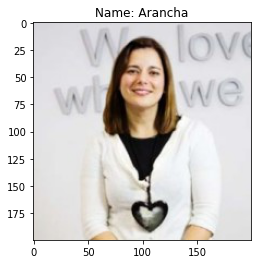

In [83]:
display_prediction()

**True Negative:** 

pred = 0, y = 0



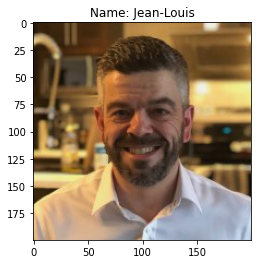

In [70]:
display_prediction(pred=0, y=0)

**There are no False Positives! (Precision = 1.0)**

**Potential Improvement:**
It might be a good idea to _error on the side of lower precision and higher recall_. 

If we're trying to identify more women, we should error on the side of predicting Woman, rather than Not Woman (i.e. more FPs than FNs).

In [77]:
#display_prediction(pred=1, y=0)

**False Negatives:**

pred = 0, y = 1



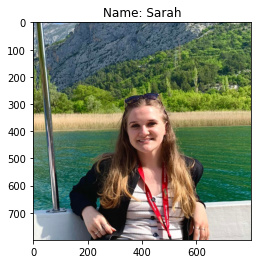

In [81]:
display_prediction(pred=0, y=1)